In [2]:
import pandas as pd
import warnings
import matplotlib.pyplot as plt
import arviz as az
import xarray as xr
import seaborn as sns
import numpy as np
import pymc as pm
warnings.filterwarnings('ignore')

C:\Users\Stepan\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
C:\Users\Stepan\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
WARNING (pytensor.configdefaults): g++ not available, if using conda: `conda install m2w64-toolchain`
WARNING (pytensor.configdefaults): g++ not detected!  PyTensor will be unable to compile C-implementations and will default to Python. Performance may be severely degraded. To remove this warning, set PyTensor flags cxx to an empty string.
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [3]:
data=pd.read_csv('males_wage.csv')
data=data.drop('Unnamed: 0',axis=1)
data

,id,Years,School,Expert,Union,Married,Black,Hisp,Wage
0,13.0,1982.0,14.0,3.0,0.0,0.0,0.0,0.0,1.344462
1,13.0,1981.0,14.0,2.0,1.0,0.0,0.0,0.0,1.853060
2,13.0,1986.0,14.0,7.0,0.0,0.0,0.0,0.0,-0.720263
3,13.0,1983.0,14.0,4.0,0.0,0.0,0.0,0.0,1.433213
4,13.0,1984.0,14.0,5.0,0.0,0.0,0.0,0.0,1.568125
...,...,...,...,...,...,...,...,...,...
4355,12548.0,1987.0,9.0,12.0,1.0,1.0,0.0,0.0,1.466543
4356,12548.0,1985.0,9.0,10.0,0.0,1.0,0.0,0.0,1.765962
4357,12548.0,1986.0,9.0,11.0,1.0,1.0,0.0,0.0,1.745894
4358,12548.0,1984.0,9.0,9.0,1.0,1.0,0.0,0.0,1.212543


In [ ]:
data.describe()

,id,Years,School,Expert,Union,Married,Black,Hisp,Wage
count,4360.000000,4360.000000,4360.000000,4360.000000,4360.000000,4360.000000,4360.000000,4360.000000,4360.000000
mean,5262.058716,1983.500000,11.766972,6.514679,0.244037,0.438991,0.115596,0.155963,1.649147
std,3496.149815,2.291551,1.746181,2.825873,0.429564,0.496321,0.319777,0.362862,0.532609
min,13.000000,1980.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.579079
25%,2329.000000,1981.750000,11.000000,4.000000,0.000000,0.000000,0.000000,0.000000,1.350717
50%,4569.000000,1983.500000,12.000000,6.000000,0.000000,0.000000,0.000000,0.000000,1.671143
75%,8406.000000,1985.250000,12.000000,9.000000,0.000000,1.000000,0.000000,0.000000,1.991086
max,12548.000000,1987.000000,16.000000,18.000000,1.000000,1.000000,1.000000,1.000000,4.051860


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4360 entries, 0 to 4359
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       4360 non-null   float64
 1   Years    4360 non-null   float64
 2   School   4360 non-null   float64
 3   Expert   4360 non-null   float64
 4   Union    4360 non-null   float64
 5   Married  4360 non-null   float64
 6   Black    4360 non-null   float64
 7   Hisp     4360 non-null   float64
 8   Wage     4360 non-null   float64
dtypes: float64(9)
memory usage: 306.7 KB


In [ ]:
data.isna().sum()

id         0
Years      0
School     0
Expert     0
Union      0
Married    0
Black      0
Hisp       0
Wage       0
dtype: int64

In [3]:
data['Union'].value_counts()

,count
Union,
0.0,3296
1.0,1064


In [ ]:
data.groupby('Union')['Wage'].mean()

Union
0.0    1.605400
1.0    1.784664
Name: Wage, dtype: float64

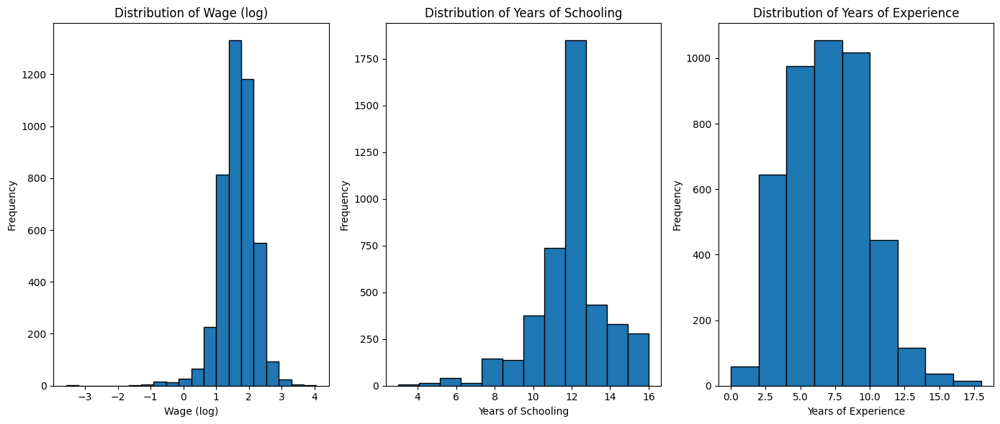

In [4]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 3, 1)
plt.hist(data['Wage'], bins=20, edgecolor='black')
plt.title('Distribution of Wage (log)')
plt.xlabel('Wage (log)')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
plt.hist(data['School'], bins=12, edgecolor='black')
plt.title('Distribution of Years of Schooling')
plt.xlabel('Years of Schooling')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
plt.hist(data['Expert'], bins=9, edgecolor='black')
plt.title('Distribution of Years of Experience')
plt.xlabel('Years of Experience')
plt.ylabel('Frequency')

plt.tight_layout()
plt.savefig('qq_plot.png', format='png', dpi=300)
plt.show()

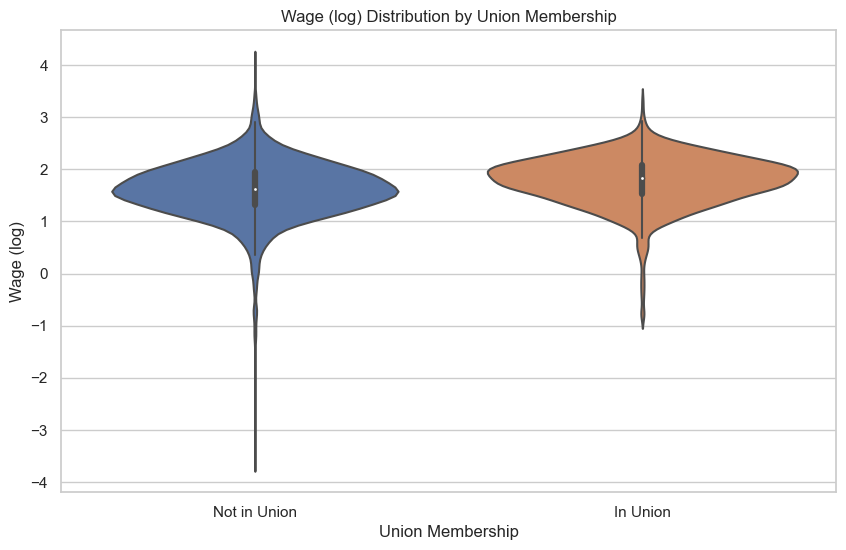

In [ ]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='Union', y='Wage', data=data)
plt.title('Wage (log) Distribution by Union Membership')
plt.xticks([0, 1], ['Not in Union', 'In Union'])
plt.xlabel('Union Membership')
plt.ylabel('Wage (log)')
plt.show()

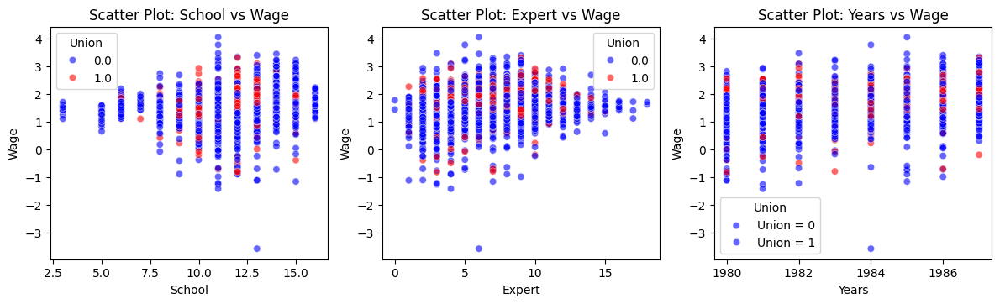

In [8]:
features = ['School', 'Expert', 'Years']

plt.figure(figsize=(12, 10))

for i, feature in enumerate(features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(data=data, x=feature, y='Wage', hue='Union', palette={0: "blue", 1: "red"}, alpha=0.6)
    plt.xlabel(feature)
    plt.ylabel('Wage')
    plt.title(f'Scatter Plot: {feature} vs Wage')

plt.tight_layout()
plt.legend(title="Union", labels=["Union = 0", "Union = 1"])
plt.show()

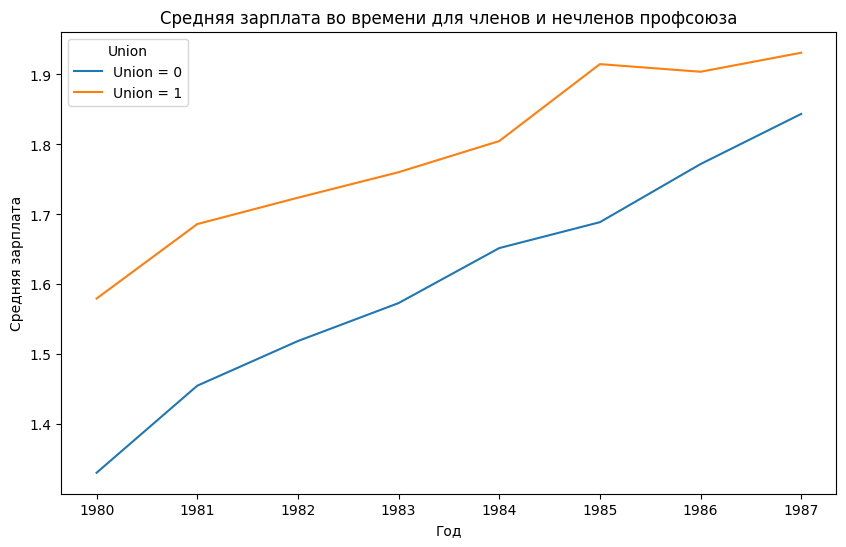

In [9]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=data, x='Years', y='Wage', hue='Union', ci=None)
plt.title('Средняя зарплата во времени для членов и нечленов профсоюза')
plt.xlabel('Год')
plt.ylabel('Средняя зарплата')
plt.legend(title="Union", labels=["Union = 0", "Union = 1"])
plt.show()

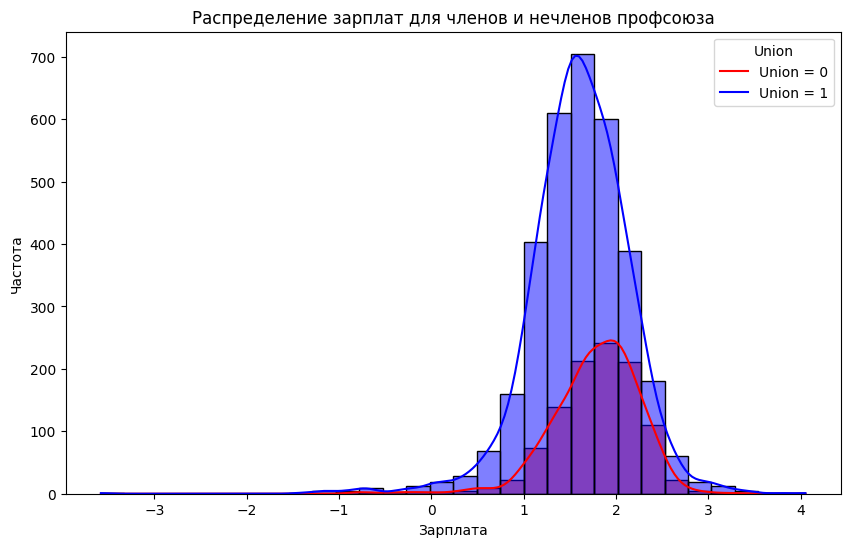

In [10]:
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='Wage', hue='Union', bins=30, kde=True, palette={0: "blue", 1: "red"}, alpha=0.5)
plt.title('Распределение зарплат для членов и нечленов профсоюза')
plt.xlabel('Зарплата')
plt.ylabel('Частота')
plt.legend(title="Union", labels=["Union = 0", "Union = 1"])
plt.show()

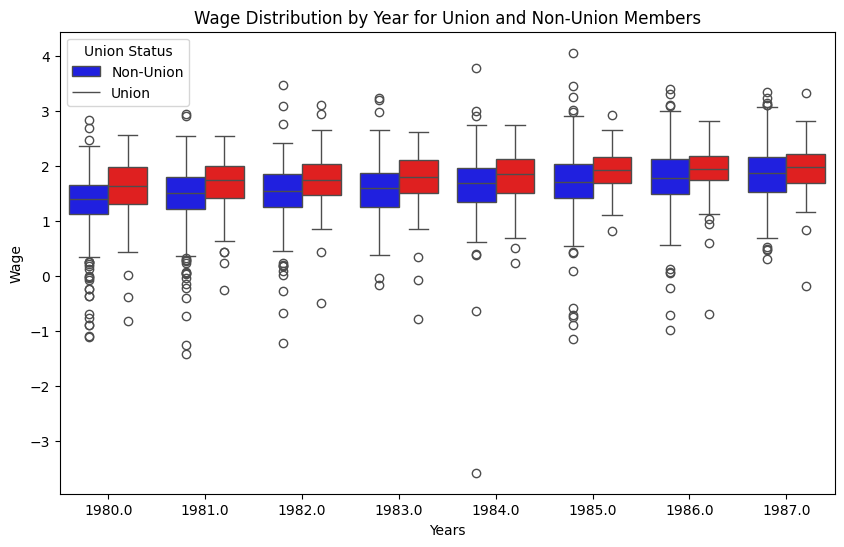

In [12]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='Years', y='Wage', hue='Union', palette={0: "blue", 1: "red"})
plt.xlabel('Years')
plt.ylabel('Wage')
plt.title('Wage Distribution by Year for Union and Non-Union Members')
plt.legend(title="Union Status", labels=["Non-Union", "Union"])
plt.show()

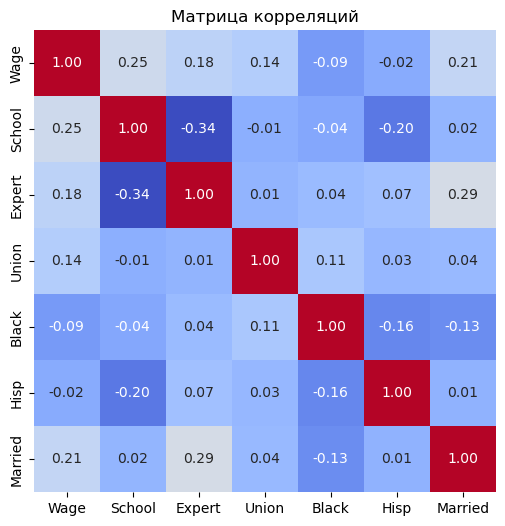

In [4]:
corr_matrix = data[['Wage', 'School', 'Expert', 'Union','Black','Hisp','Married']].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar=False,
            xticklabels=corr_matrix.columns, yticklabels=corr_matrix.columns)

plt.title('Матрица корреляций')
plt.savefig('wage.png', format='png', dpi=300)
plt.show();

## Вероятностное программирование

для начала рассмотрим обычные модели и постепенно будем добавлять признаки

In [5]:
with pm.Model() as model0:
    β_0 = pm.Normal('β_0', mu=0, sigma=10)
    β_union = pm.Normal('β_union', mu=0, sigma=10)
    σ = pm.HalfNormal('σ', sigma=5)

    mu = (β_0 +
          β_union * data['Union'])

    wage = pm.Normal('Wage', mu=mu, sigma=σ, observed=data['Wage'])

    trace = pm.sample(2000,chains=4,idata_kwargs={"log_likelihood": True})

Output()

Output()

Output()

Output()

In [ ]:
az.summary(trace,
           var_names=["β_0","β_union", "σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β_0,1.605,0.009,1.587,1.622,0.0,0.0,6545.0,6258.0,1.0
β_union,0.180,0.018,0.147,0.216,0.0,0.0,6051.0,5441.0,1.0
σ,0.527,0.006,0.517,0.537,0.0,0.0,7896.0,6168.0,1.0


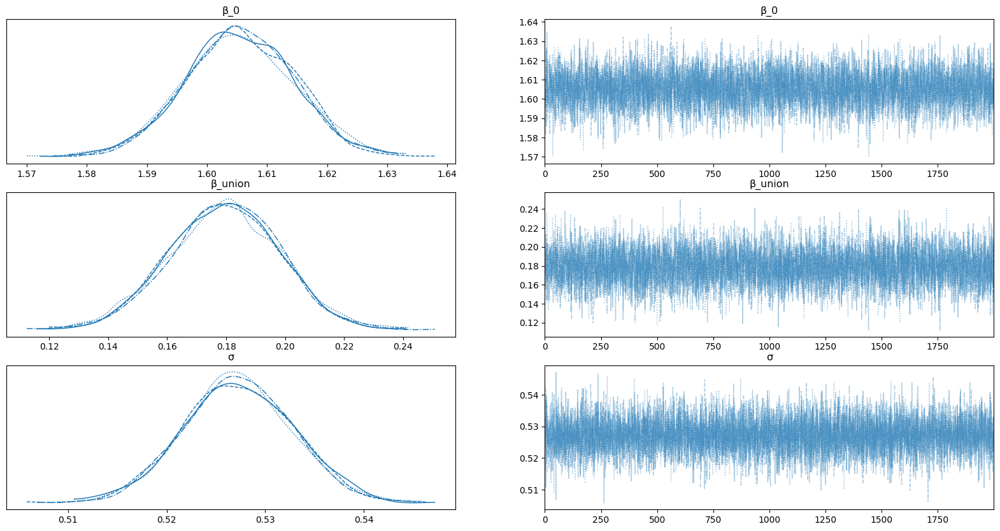

In [ ]:
axes = az.plot_trace(trace,var_names=["β_0","β_union", "σ"], figsize=(20, 10))


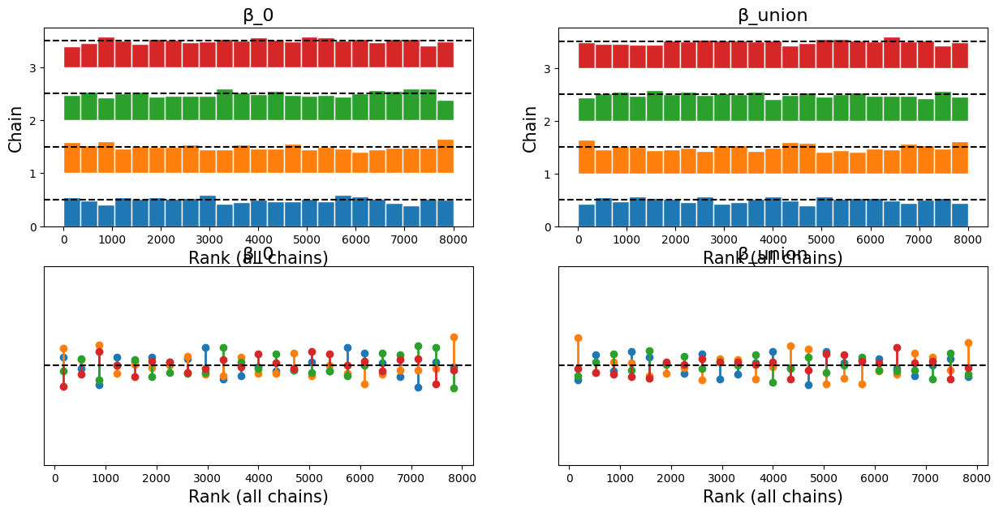

In [ ]:
fig, (ax1,ax2) = plt.subplots(2,2, figsize=(15,7))
az.plot_rank(trace, kind="bars", ax=ax1);
az.plot_rank(trace, kind="vlines", ax=ax2);

In [6]:
with pm.Model() as model1:
    β_0 = pm.Normal('β_0', mu=0, sigma=10)
    β_union = pm.Normal('β_union', mu=0, sigma=10)
    β_expert = pm.Normal('β_expert', mu=0, sigma=10)

    σ = pm.HalfNormal('σ', sigma=5)

    mu = (β_0 +
          β_union * data['Union']+β_expert*data['Expert'])

    wage = pm.Normal('Wage', mu=mu, sigma=σ, observed=data['Wage'])

    trace2 = pm.sample(2000,chains=4,idata_kwargs={"log_likelihood": True})

Output()

Output()

Output()

Output()

In [ ]:
az.summary(trace2,
           var_names=["β_0","β_union", "β_expert","σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β_0,1.388,0.020,1.348,1.425,0.0,0.0,8536.0,10923.0,1.0
β_union,0.177,0.018,0.142,0.211,0.0,0.0,16917.0,13115.0,1.0
β_expert,0.034,0.003,0.028,0.039,0.0,0.0,8769.0,10874.0,1.0
σ,0.519,0.006,0.508,0.529,0.0,0.0,14217.0,12913.0,1.0


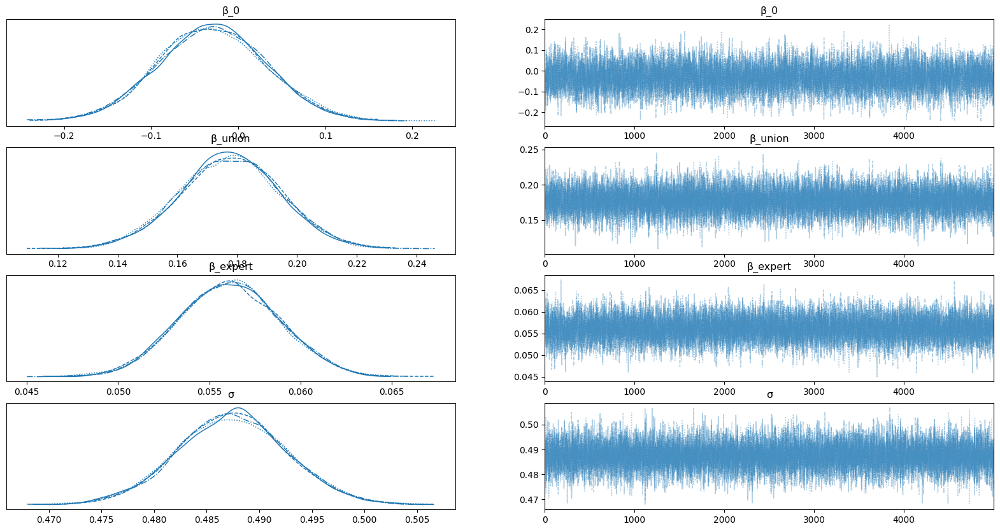

In [ ]:
axes = az.plot_trace(trace2,var_names=["β_0","β_union", "β_expert","σ"], figsize=(20, 10))


In [7]:
with pm.Model() as model2:
    β_0 = pm.Normal('β_0', mu=0, sigma=10)
    β_union = pm.Normal('β_union', mu=0, sigma=10)
    β_expert = pm.Normal('β_expert', mu=0, sigma=10)
    β_school = pm.Normal('β_school', mu=0, sigma=10)
    σ = pm.HalfNormal('σ', sigma=5)

    mu = (β_0 + β_union * data['Union']+β_expert*data['Expert']+β_school*data['School'])

    wage = pm.Normal('Wage', mu=mu, sigma=σ, observed=data['Wage'])

    trace3 = pm.sample(2000,chains=4,idata_kwargs={"log_likelihood": True})

Output()

Output()

Output()

Output()

In [ ]:
az.summary(trace3,
           var_names=["β_0","β_union", "β_expert","β_school","σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β_0,-0.030,0.062,-0.148,0.089,0.001,0.001,3595.0,3799.0,1.0
β_union,0.178,0.017,0.145,0.210,0.000,0.000,6978.0,4499.0,1.0
β_expert,0.056,0.003,0.051,0.061,0.000,0.000,4814.0,4924.0,1.0
β_school,0.108,0.005,0.100,0.117,0.000,0.000,4001.0,3562.0,1.0
σ,0.487,0.005,0.478,0.497,0.000,0.000,6730.0,4915.0,1.0


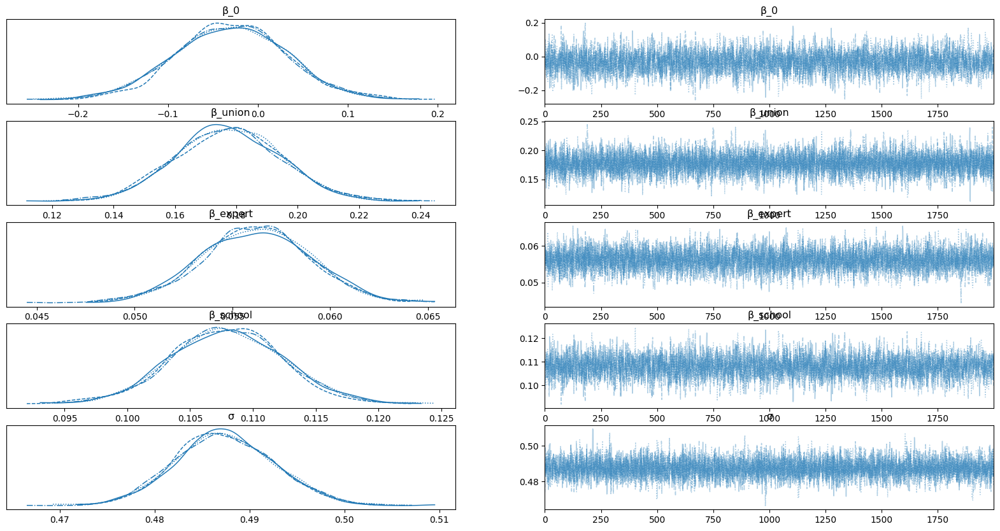

In [ ]:
axes = az.plot_trace(trace3,var_names=["β_0","β_union", "β_expert","β_school","σ"], figsize=(20, 10))


In [8]:
with pm.Model() as model3:
    β_0 = pm.Normal('β_0', mu=0, sigma=10)
    β_union = pm.Normal('β_union', mu=0, sigma=10)
    β_school = pm.Normal('β_school', mu=0, sigma=10)
    β_expert = pm.Normal('β_expert', mu=0, sigma=10)
    β_married = pm.Normal('β_married', mu=0, sigma=10)
    σ = pm.HalfNormal('σ', sigma=5)

    mu = (β_0 +
          β_union * data['Union'] +
          β_school * data['School'] +
          β_expert * data['Expert'] +
          β_married * data['Married'])

    wage = pm.Normal('Wage', mu=mu, sigma=σ, observed=data['Wage'])

    trace4 = pm.sample(2000,chains=4,idata_kwargs={"log_likelihood": True})

Output()

Output()

Output()

Output()

In [ ]:
az.summary(trace4,
           var_names=["β_0","β_union", "β_expert","β_school","β_married","σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β_0,0.020,0.062,-0.095,0.133,0.001,0.001,3839.0,4497.0,1.0
β_union,0.172,0.017,0.141,0.204,0.000,0.000,8436.0,5298.0,1.0
β_expert,0.049,0.003,0.043,0.054,0.000,0.000,5272.0,5174.0,1.0
β_school,0.103,0.005,0.095,0.112,0.000,0.000,4141.0,4934.0,1.0
β_married,0.128,0.016,0.099,0.157,0.000,0.000,7151.0,5381.0,1.0
σ,0.484,0.005,0.475,0.494,0.000,0.000,7968.0,5553.0,1.0


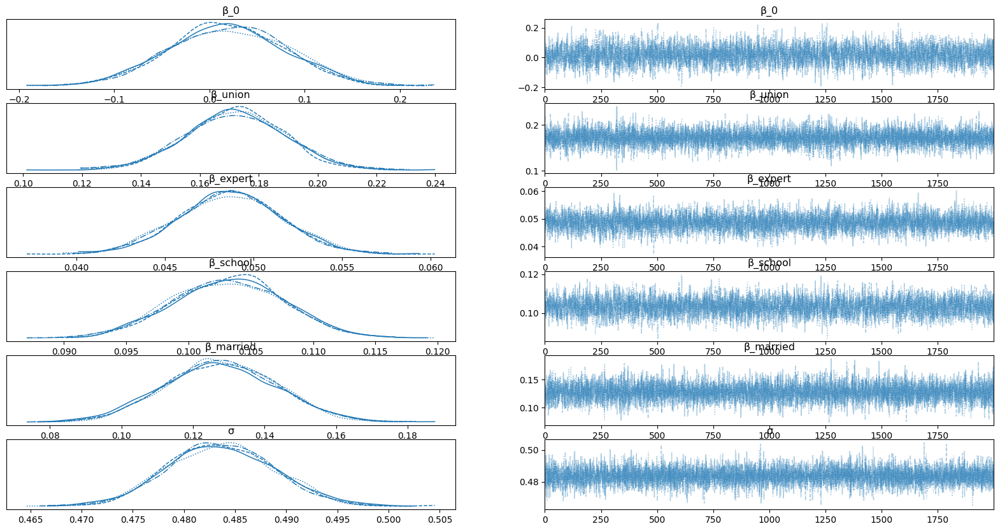

In [ ]:
axes = az.plot_trace(trace4,var_names=["β_0","β_union", "β_expert","β_school","β_married","σ"], figsize=(20, 10))


In [9]:
with pm.Model() as model4:
    β_0 = pm.Normal('β_0', mu=0, sigma=10)
    β_union = pm.Normal('β_union', mu=0, sigma=10)
    β_school = pm.Normal('β_school', mu=0, sigma=10)
    β_expert = pm.Normal('β_expert', mu=0, sigma=10)
    β_married = pm.Normal('β_married', mu=0, sigma=10)
    β_black = pm.Normal('β_black', mu=0, sigma=10)
    σ = pm.HalfNormal('σ', sigma=5)

    mu = (β_0 +
          β_union * data['Union'] +
          β_school * data['School'] +
          β_expert * data['Expert'] +
          β_married * data['Married'] +
          β_black * data['Black'])

    wage = pm.Normal('Wage', mu=mu, sigma=σ, observed=data['Wage'])

    trace5 = pm.sample(2000,chains=4,idata_kwargs={"log_likelihood": True})

Output()

Output()

Output()

Output()

In [ ]:
az.summary(trace5,
           var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β_0,0.031,0.061,-0.082,0.147,0.001,0.001,4379.0,4651.0,1.0
β_union,0.185,0.017,0.152,0.215,0.000,0.000,7727.0,5514.0,1.0
β_expert,0.050,0.003,0.045,0.056,0.000,0.000,5572.0,5574.0,1.0
β_school,0.103,0.004,0.095,0.111,0.000,0.000,4849.0,5129.0,1.0
β_married,0.113,0.016,0.082,0.141,0.000,0.000,7775.0,5174.0,1.0
β_black,-0.145,0.023,-0.190,-0.103,0.000,0.000,8258.0,6010.0,1.0
σ,0.482,0.005,0.472,0.491,0.000,0.000,8131.0,4960.0,1.0


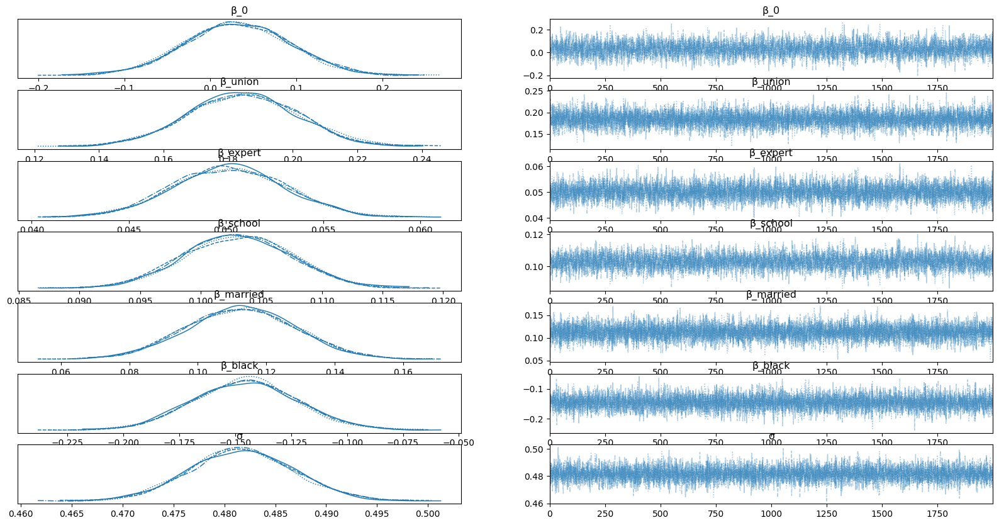

In [ ]:
axes = az.plot_trace(trace5,var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","σ"], figsize=(20, 10))


In [10]:
with pm.Model() as model5:
    β_0 = pm.Normal('β_0', mu=0, sigma=10)
    β_union = pm.Normal('β_union', mu=0, sigma=10)
    β_school = pm.Normal('β_school', mu=0, sigma=10)
    β_expert = pm.Normal('β_expert', mu=0, sigma=10)
    β_married = pm.Normal('β_married', mu=0, sigma=10)
    β_black = pm.Normal('β_black', mu=0, sigma=10)
    β_hisp = pm.Normal('β_hisp', mu=0, sigma=10)
    σ = pm.HalfNormal('σ', sigma=5)

    mu = (β_0 +
          β_union * data['Union'] +
          β_school * data['School'] +
          β_expert * data['Expert'] +
          β_married * data['Married'] +
          β_black * data['Black'] +
          β_hisp * data['Hisp'])

    wage = pm.Normal('Wage', mu=mu, sigma=σ, observed=data['Wage'])

    trace_all = pm.sample(2000,chains=4,idata_kwargs={"log_likelihood": True})

Output()

Output()

Output()

Output()

In [ ]:
az.summary(trace_all,
           var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","β_hisp","σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β_0,0.022,0.063,-0.091,0.143,0.001,0.001,4816.0,5307.0,1.0
β_union,0.184,0.017,0.153,0.215,0.000,0.000,8803.0,5560.0,1.0
β_expert,0.050,0.003,0.045,0.055,0.000,0.000,6170.0,5848.0,1.0
β_school,0.104,0.005,0.095,0.112,0.000,0.000,5233.0,5296.0,1.0
β_married,0.112,0.016,0.083,0.143,0.000,0.000,8459.0,5671.0,1.0
β_black,-0.142,0.024,-0.187,-0.098,0.000,0.000,9840.0,5560.0,1.0
β_hisp,0.013,0.021,-0.027,0.052,0.000,0.000,9724.0,5920.0,1.0
σ,0.482,0.005,0.472,0.492,0.000,0.000,9375.0,5298.0,1.0


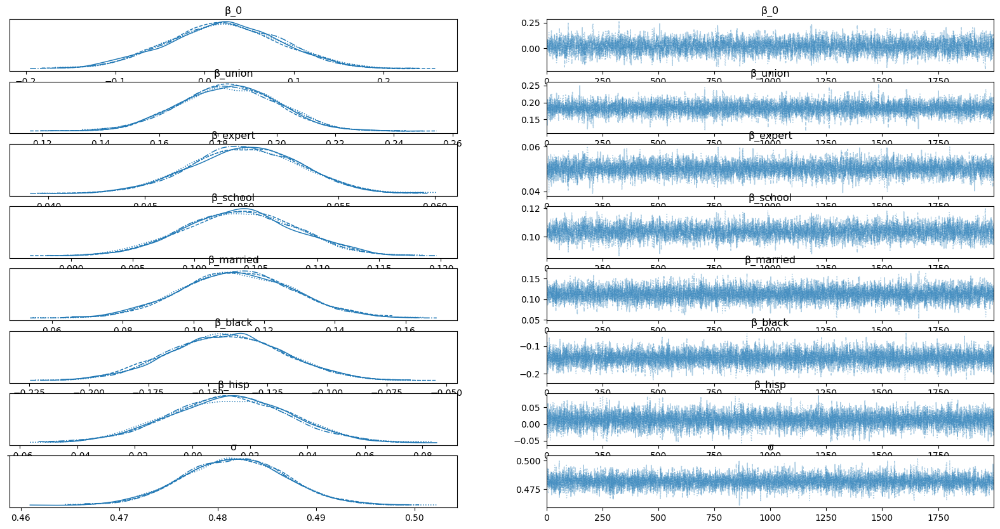

In [ ]:
axes = az.plot_trace(trace_all,var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","β_hisp","σ"], figsize=(20, 10))


In [11]:
data['Years_scaled']=(data['Years']-data['Years'].mean())/data['Years'].std()
with pm.Model() as model6:
    β_0 = pm.Normal('β_0', mu=0, sigma=10)
    β_union = pm.Normal('β_union', mu=0, sigma=10)
    β_school = pm.Normal('β_school', mu=0, sigma=10)
    β_expert = pm.Normal('β_expert', mu=0, sigma=10)
    β_married = pm.Normal('β_married', mu=0, sigma=10)
    β_black = pm.Normal('β_black', mu=0, sigma=10)
    β_hisp = pm.Normal('β_hisp', mu=0, sigma=10)
    β_year=pm.Normal('β_year', mu=0, sigma=10)
    σ = pm.HalfNormal('σ', sigma=5)

    mu = (β_0 +
          β_union * data['Union'] +
          β_school * data['School'] +
          β_expert * data['Expert'] +
          β_married * data['Married'] +
          β_black * data['Black'] +
          β_hisp * data['Hisp']+
          β_year*data['Years_scaled'])

    wage = pm.Normal('Wage', mu=mu, sigma=σ, observed=data['Wage'])

    trace_year = pm.sample(2000,chains=4,idata_kwargs={"log_likelihood": True})

Output()

Output()

Output()

Output()

In [ ]:
az.summary(trace_year,
           var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","β_hisp","β_year","σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β_0,0.277,0.086,0.110,0.433,0.002,0.001,2946.0,3411.0,1.0
β_union,0.187,0.017,0.153,0.219,0.000,0.000,6268.0,4843.0,1.0
β_expert,0.030,0.005,0.020,0.041,0.000,0.000,2840.0,4037.0,1.0
β_school,0.093,0.005,0.084,0.103,0.000,0.000,3641.0,4397.0,1.0
β_married,0.112,0.016,0.082,0.142,0.000,0.000,6262.0,5164.0,1.0
β_black,-0.138,0.024,-0.184,-0.093,0.000,0.000,7063.0,5185.0,1.0
β_hisp,0.013,0.021,-0.025,0.052,0.000,0.000,6515.0,5763.0,1.0
β_year,0.061,0.014,0.034,0.088,0.000,0.000,3131.0,3989.0,1.0
σ,0.481,0.005,0.471,0.490,0.000,0.000,8629.0,6118.0,1.0


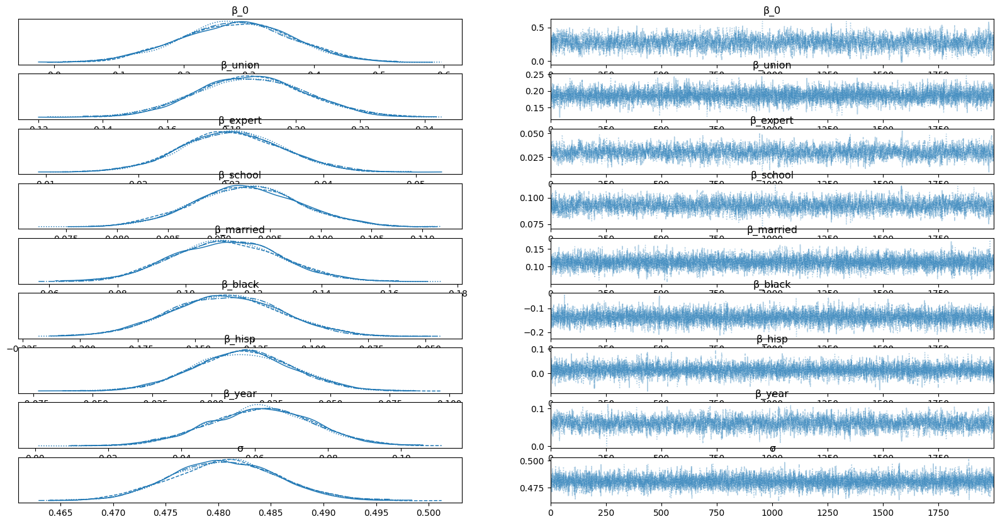

In [123]:
axes = az.plot_trace(trace_year,var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","β_hisp","β_year","σ"], figsize=(20, 10))


In [12]:
data['School_centered'] = data['School'] - data['School'].mean()
data['Expert_centered'] = data['Expert'] - data['Expert'].mean()
with pm.Model() as model7:
    β_0 = pm.Normal('β_0', mu=0, sigma=10)
    β_union = pm.Normal('β_union', mu=0, sigma=10)
    β_school = pm.Normal('β_school', mu=0, sigma=10)
    β_expert = pm.Normal('β_expert', mu=0, sigma=10)
    β_married = pm.Normal('β_married', mu=0, sigma=10)
    β_black = pm.Normal('β_black', mu=0, sigma=10)
    β_hisp = pm.Normal('β_hisp', mu=0, sigma=10)
    β_year=pm.Normal('β_year', mu=0, sigma=10)
    σ = pm.HalfNormal('σ', sigma=5)

    mu = (β_0 +
          β_union * data['Union'] +
          β_school * data['School_centered'] +
          β_expert * data['Expert_centered'] +
          β_married * data['Married'] +
          β_black * data['Black'] +
          β_hisp * data['Hisp']+
          β_year*data['Years_scaled'])

    wage = pm.Normal('Wage', mu=mu, sigma=σ, observed=data['Wage'])

    trace_centr = pm.sample(2000,chains=4,idata_kwargs={"log_likelihood": True})

Output()

Output()

Output()

Output()

In [ ]:
az.summary(trace_centr,
           var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","β_hisp","β_year","σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β_0,1.568,0.012,1.546,1.589,0.0,0.0,6001.0,5846.0,1.0
β_union,0.186,0.017,0.153,0.217,0.0,0.0,8041.0,5946.0,1.0
β_expert,0.030,0.005,0.020,0.040,0.0,0.0,5386.0,5819.0,1.0
β_school,0.093,0.005,0.083,0.102,0.0,0.0,7026.0,6675.0,1.0
β_married,0.112,0.016,0.083,0.141,0.0,0.0,7179.0,5433.0,1.0
β_black,-0.137,0.023,-0.182,-0.094,0.0,0.0,8914.0,6100.0,1.0
β_hisp,0.014,0.021,-0.026,0.052,0.0,0.0,10444.0,6627.0,1.0
β_year,0.061,0.014,0.035,0.088,0.0,0.0,5757.0,6041.0,1.0
σ,0.481,0.005,0.472,0.491,0.0,0.0,11368.0,6295.0,1.0


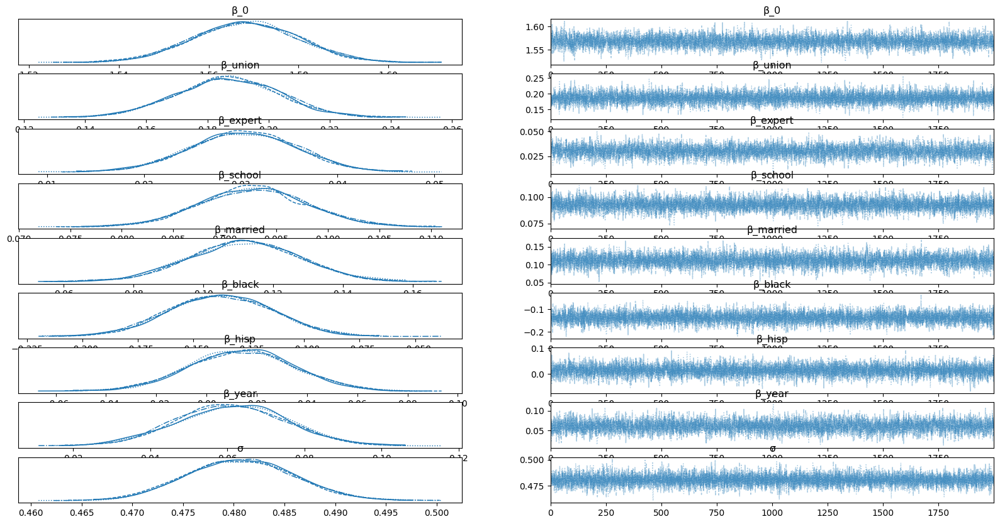

In [124]:
axes = az.plot_trace(trace_centr,var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","β_hisp","β_year","σ"], figsize=(20, 10))


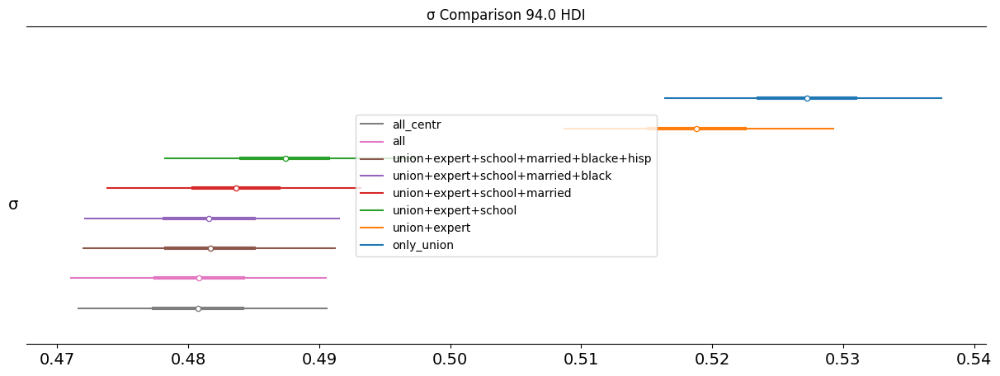

In [26]:
axes = az.plot_forest(
    [trace,trace2,trace3,trace4,trace5,trace_all,trace_year,trace_centr],
    model_names=["only_union", "union+expert","union+expert+school","union+expert+school+married","union+expert+school+married+black",
                 "union+expert+school+married+blacke+hisp","all","all_centr"],
    var_names=["σ"], combined=True, figsize=(15, 5))
axes[0].set_title("σ Comparison 94.0 HDI");

In [30]:
traces =[trace,trace2,trace3,trace4,trace5,trace_all,trace_year,trace_centr]
model_dict = dict(zip(["only_union", "union+expert","union+expert+school","union+expert+school+married","union+expert+school+married+black",
                 "union+expert+school+married+blacke+hisp","all","all_centr"], traces))
comp = az.compare(model_dict)
comp

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
all_centr,0,-2998.998624,12.389342,0.000000,9.529687e-01,100.954392,0.000000,False,log
all,1,-2999.083692,12.509106,0.085068,0.000000e+00,100.911127,0.054295,False,log
union+expert+school+married+black,2,-3006.445300,10.627213,7.446676,8.832078e-04,100.829332,4.217713,False,log
union+expert+school+married+blacke+hisp,3,-3007.012176,11.325034,8.013552,4.116539e-10,100.772094,4.181814,False,log
union+expert+school+married,4,-3024.559104,9.302030,25.560480,1.368819e-10,100.136486,7.564085,False,log
union+expert+school,5,-3057.028120,8.208839,58.029496,1.105829e-10,99.917407,10.630274,False,log
union+expert,6,-3327.062816,6.390067,328.064191,1.494830e-12,88.515919,27.266572,False,log
only_union,7,-3397.630566,5.465008,398.631942,4.614808e-02,88.427197,30.771462,False,log


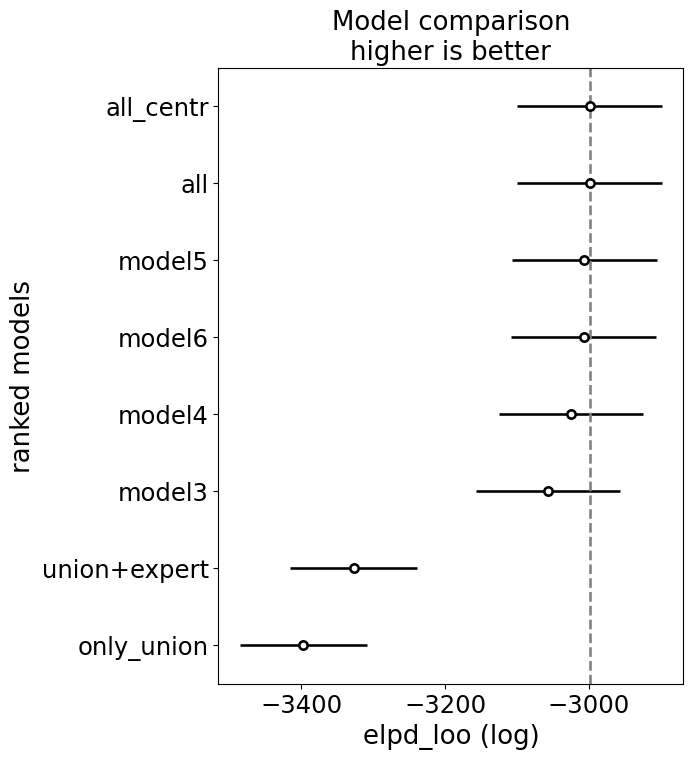

In [35]:
az.plot_compare(comp);

Output()

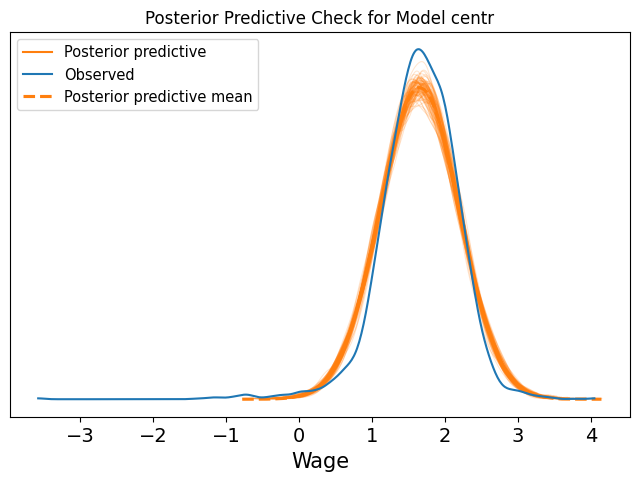

In [130]:
with model7:
    sample0 = pm.sample_posterior_predictive(trace_centr, var_names=['Wage'])

fig, ax = plt.subplots(figsize=(8, 5))
az.plot_ppc(sample0, num_pp_samples=100, ax=ax, legend=True, colors=["C1", "C0", "C1"])
ax.set_title("Posterior Predictive Check for Model centr")

plt.show()

Output()

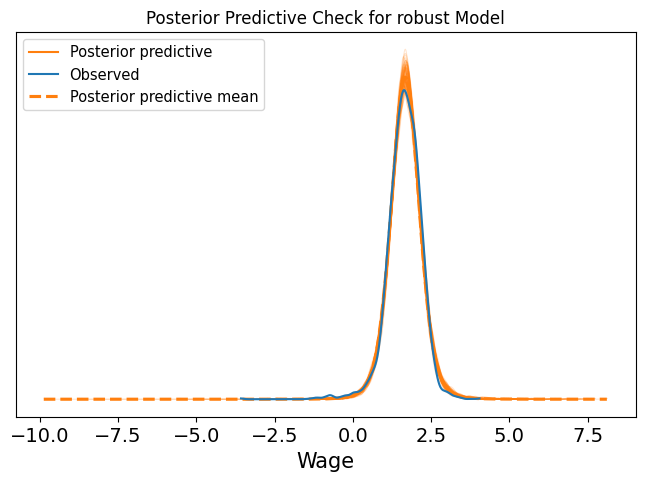

In [131]:
with model_rob:
    sample0 = pm.sample_posterior_predictive(trace_rob, var_names=['Wage'])

fig, ax = plt.subplots(figsize=(8, 5))
az.plot_ppc(sample0, num_pp_samples=100, ax=ax, legend=True, colors=["C1", "C0", "C1"])
ax.set_title("Posterior Predictive Check for robust Model")
plt.savefig('wage.png', format='png', dpi=300)

plt.show()

Робастная модель

In [13]:
with pm.Model() as model_rob:
    β_0 = pm.Normal('β_0', mu=0, sigma=10)
    β_union = pm.Normal('β_union', mu=0, sigma=10)
    β_school = pm.Normal('β_school', mu=0, sigma=10)
    β_expert = pm.Normal('β_expert', mu=0, sigma=10)
    β_married = pm.Normal('β_married', mu=0, sigma=10)
    β_black = pm.Normal('β_black', mu=0, sigma=10)
    β_hisp = pm.Normal('β_hisp', mu=0, sigma=10)
    β_year=pm.Normal('β_year', mu=0, sigma=10)
    σ = pm.HalfNormal('σ', sigma=5)

    mu = (β_0 +
          β_union * data['Union'] +
          β_school * data['School_centered'] +
          β_expert * data['Expert_centered'] +
          β_married * data['Married'] +
          β_black * data['Black'] +
          β_hisp * data['Hisp']+
          β_year*data['Years_scaled'])
    ν_ = pm.Exponential('ν_', 1/29)
    ν = pm.Deterministic('ν', ν_ + 1)
    wage = pm.StudentT('Wage', mu=mu, sigma=σ,nu=ν, observed=data['Wage'])

    trace_rob = pm.sample(2000,chains=4,idata_kwargs={"log_likelihood": True})

Output()

Output()

Output()

Output()

In [37]:
az.summary(trace_rob,
           var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","β_hisp","β_year","σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β_0,1.600,0.010,1.580,1.620,0.0,0.0,5977.0,6195.0,1.0
β_union,0.180,0.015,0.153,0.209,0.0,0.0,9449.0,6263.0,1.0
β_expert,0.032,0.005,0.023,0.040,0.0,0.0,5134.0,5400.0,1.0
β_school,0.095,0.005,0.086,0.103,0.0,0.0,6954.0,6056.0,1.0
β_married,0.098,0.014,0.073,0.124,0.0,0.0,6999.0,5960.0,1.0
β_black,-0.134,0.021,-0.174,-0.094,0.0,0.0,9921.0,6071.0,1.0
β_hisp,0.021,0.018,-0.013,0.053,0.0,0.0,8951.0,6051.0,1.0
β_year,0.046,0.012,0.023,0.069,0.0,0.0,5488.0,5772.0,1.0
σ,0.363,0.006,0.351,0.375,0.0,0.0,7566.0,6241.0,1.0


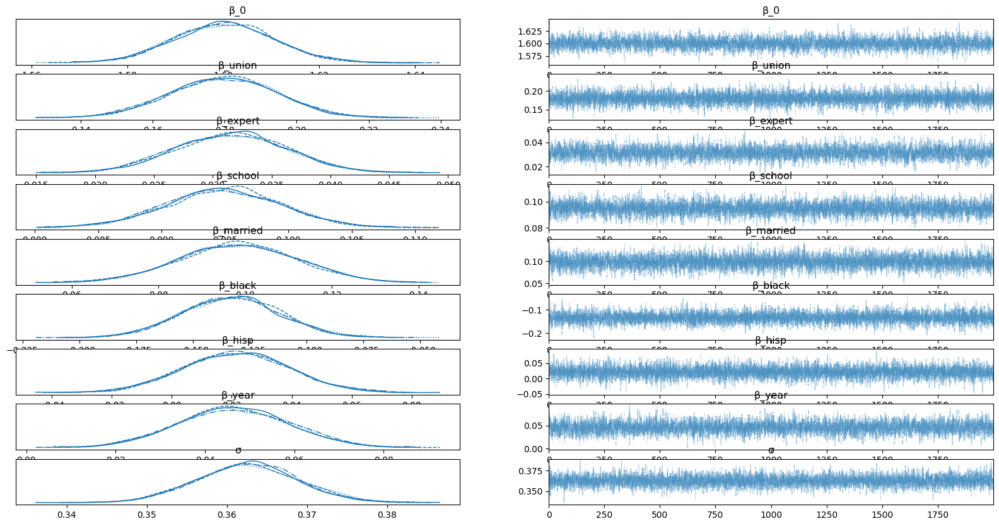

In [125]:
axes = az.plot_trace(trace_rob,var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","β_hisp","β_year","σ"], figsize=(20, 10))

''

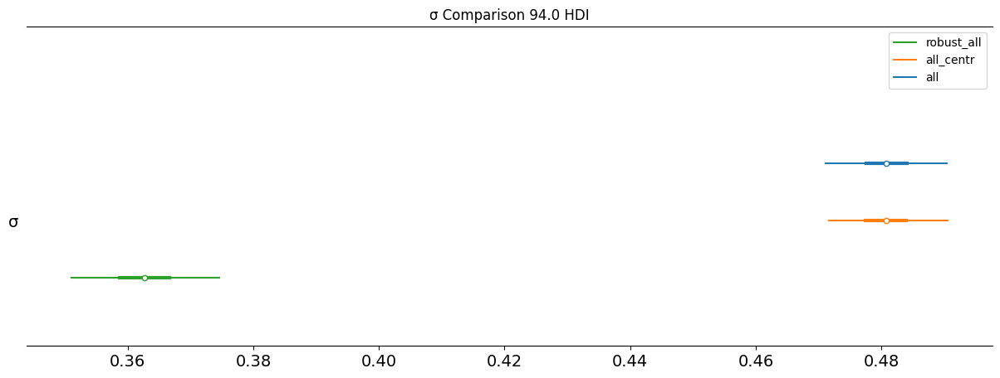

In [40]:
axes = az.plot_forest(
    [trace_year,trace_centr,trace_rob],
    model_names=["all","all_centr","robust_all"],
    var_names=["σ"], combined=True, figsize=(15, 5))
axes[0].set_title("σ Comparison 94.0 HDI")
;

In [39]:
traces =[trace_year,trace_centr,trace_rob]
model_dict = dict(zip(["all","all_centr","robust_all"], traces))
comp = az.compare(model_dict)
comp

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
robust_all,0,-2696.363981,10.308356,0.000000,0.978984,63.059951,0.000000,False,log
all_centr,1,-2998.998624,12.389342,302.634643,0.021016,100.954392,61.896418,False,log
all,2,-2999.083692,12.509106,302.719711,0.000000,100.911127,61.869052,False,log


Иерархическая модель

In [14]:
data['School_centered'] = data['School'] - data['School'].mean()
data['Expert_centered'] = data['Expert'] - data['Expert'].mean()
data['Years_scaled'] = (data['Years'] - data['Years'].mean()) / data['Years'].std()

id_index = data['id'].astype("category").cat.codes.values
year_index = data['Years'].astype("category").cat.codes.values

with pm.Model() as hierarchical_model:
    β_0 = pm.Normal('β_0', mu=0, sigma=10)
    β_union = pm.Normal('β_union', mu=0, sigma=10)
    β_school = pm.Normal('β_school', mu=0, sigma=10)
    β_expert = pm.Normal('β_expert', mu=0, sigma=10)
    β_married = pm.Normal('β_married', mu=0, sigma=10)
    β_black = pm.Normal('β_black', mu=0, sigma=10)
    β_hisp = pm.Normal('β_hisp', mu=0, sigma=10)

    σ_id = pm.HalfNormal('σ_id', sigma=1)
    u_id = pm.Normal('u_id', mu=0, sigma=σ_id, shape=len(np.unique(id_index)))


    mu = (β_0 +
          β_union * data['Union'] +
          β_school * data['School_centered'] +
          β_expert * data['Expert_centered'] +
          β_married * data['Married'] +
          β_black * data['Black'] +
          β_hisp * data['Hisp'] +
          u_id[id_index] )

    σ = pm.HalfNormal('σ', sigma=1)

    wage = pm.Normal('Wage', mu=mu, sigma=σ, observed=data['Wage'])

    trace_hierarchical = pm.sample(2000, chains=4, return_inferencedata=True, idata_kwargs={"log_likelihood": True})


Output()

Output()

Output()

Output()

In [15]:
data['School_centered'] = data['School'] - data['School'].mean()
data['Expert_centered'] = data['Expert'] - data['Expert'].mean()
data['Years_scaled'] = (data['Years'] - data['Years'].mean()) / data['Years'].std()

id_index = data['id'].astype("category").cat.codes.values
year_index = data['Years'].astype("category").cat.codes.values

with pm.Model() as hierarchical_model2:
    β_0 = pm.Normal('β_0', mu=0, sigma=10)
    β_union = pm.Normal('β_union', mu=0, sigma=10)
    β_school = pm.Normal('β_school', mu=0, sigma=10)
    β_expert = pm.Normal('β_expert', mu=0, sigma=10)
    β_married = pm.Normal('β_married', mu=0, sigma=10)
    β_black = pm.Normal('β_black', mu=0, sigma=10)
    β_hisp = pm.Normal('β_hisp', mu=0, sigma=10)
    β_year=pm.Normal('β_year', mu=0, sigma=10)
    σ_id = pm.HalfNormal('σ_id', sigma=5)
    u_id = pm.Normal('u_id', mu=0, sigma=σ_id, shape=len(np.unique(id_index)))


    mu = (β_0 +
          β_union * data['Union'] +
          β_school * data['School_centered'] +
          β_expert * data['Expert_centered'] +
          β_married * data['Married'] +
          β_black * data['Black'] +
          β_hisp * data['Hisp'] +
          β_year*data['Years_scaled']+
          u_id[id_index] )

    σ = pm.HalfNormal('σ', sigma=5)

    wage = pm.Normal('Wage', mu=mu, sigma=σ, observed=data['Wage'])

    trace_hierarchical2 = pm.sample(2000, chains=4, idata_kwargs={"log_likelihood": True})


Output()

Output()

Output()

Output()

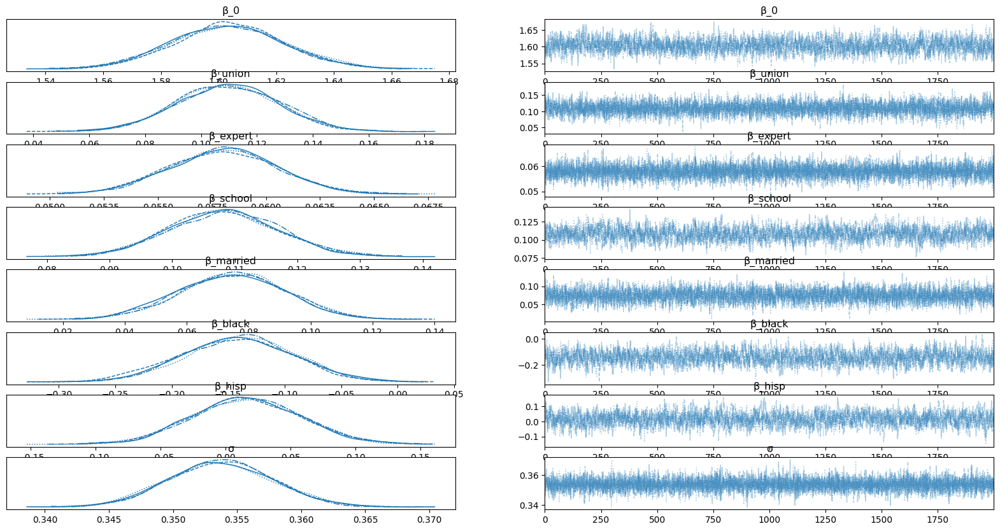

In [ ]:
axes = az.plot_trace(trace_hierarchical,var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","β_hisp","σ"], figsize=(20, 10))


In [127]:
az.summary(trace_hierarchical,
           var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","β_hisp","σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β_0,1.604,0.020,1.569,1.643,0.000,0.000,1632.0,2871.0,1.0
β_union,0.110,0.018,0.075,0.144,0.000,0.000,6077.0,6152.0,1.0
β_expert,0.058,0.003,0.053,0.063,0.000,0.000,7664.0,6251.0,1.0
β_school,0.108,0.009,0.091,0.124,0.000,0.000,1629.0,2823.0,1.0
β_married,0.076,0.017,0.045,0.108,0.000,0.000,4509.0,5795.0,1.0
β_black,-0.141,0.048,-0.229,-0.049,0.001,0.001,1470.0,2653.0,1.0
β_hisp,0.015,0.043,-0.062,0.099,0.001,0.001,1592.0,2729.0,1.0
σ,0.354,0.004,0.346,0.361,0.000,0.000,10871.0,5928.0,1.0


In [129]:
az.summary(trace_hierarchical2,
           var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","β_hisp","β_year","σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β_0,1.602,0.020,1.565,1.640,0.000,0.000,2809.0,4104.0,1.0
β_union,0.110,0.018,0.078,0.145,0.000,0.000,8833.0,6813.0,1.0
β_expert,0.033,0.011,0.012,0.054,0.000,0.000,2321.0,3617.0,1.0
β_school,0.095,0.011,0.075,0.115,0.000,0.000,2420.0,3654.0,1.0
β_married,0.075,0.017,0.045,0.107,0.000,0.000,8834.0,7003.0,1.0
β_black,-0.133,0.048,-0.221,-0.041,0.001,0.001,2472.0,4183.0,1.0
β_hisp,0.018,0.043,-0.065,0.097,0.001,0.001,2530.0,4406.0,1.0
β_year,0.059,0.026,0.012,0.109,0.001,0.000,2370.0,3716.0,1.0
σ,0.354,0.004,0.347,0.362,0.000,0.000,9532.0,5928.0,1.0


In [47]:
id_index = data['id'].astype("category").cat.codes.values
year_index = data['Years'].astype("category").cat.codes.values

with pm.Model() as hierarchical_model3:
    β_0 = pm.Normal('β_0', mu=0, sigma=10)
    β_union = pm.Normal('β_union', mu=0, sigma=10)
    β_school = pm.Normal('β_school', mu=0, sigma=10)
    β_expert = pm.Normal('β_expert', mu=0, sigma=10)
    β_married = pm.Normal('β_married', mu=0, sigma=10)
    β_black = pm.Normal('β_black', mu=0, sigma=10)
    β_hisp = pm.Normal('β_hisp', mu=0, sigma=10)

    σ_year = pm.HalfNormal('σ_year', sigma=5)
    u_year = pm.Normal('u_year', mu=0, sigma=σ_year, shape=len(np.unique(year_index)))

    mu = (β_0 +
          β_union * data['Union'] +
          β_school * data['School_centered'] +
          β_expert * data['Expert_centered'] +
          β_married * data['Married'] +
          β_black * data['Black'] +
          β_hisp * data['Hisp'] +
          u_year[year_index])

    σ = pm.HalfNormal('σ', sigma=5)

    wage = pm.Normal('Wage', mu=mu, sigma=σ, observed=data['Wage'])

    trace_hierarchical3 = pm.sample(2000, chains=4,  idata_kwargs={"log_likelihood": True})


Output()

Output()

Output()

Output()

ERROR:pymc.stats.convergence:There were 12 divergences after tuning. Increase `target_accept` or reparameterize.


In [27]:
id_index = data['id'].astype("category").cat.codes.values
year_index = data['Years'].astype("category").cat.codes.values

with pm.Model() as hierarchical_model4:
    β_0 = pm.Normal('β_0', mu=0, sigma=10)
    β_union = pm.Normal('β_union', mu=0, sigma=10)
    β_school = pm.Normal('β_school', mu=0, sigma=10)
    β_expert = pm.Normal('β_expert', mu=0, sigma=10)
    β_married = pm.Normal('β_married', mu=0, sigma=10)
    β_black = pm.Normal('β_black', mu=0, sigma=10)
    β_hisp = pm.Normal('β_hisp', mu=0, sigma=10)
    β_year=pm.Normal('β_year', mu=0, sigma=10)
    σ_id = pm.HalfNormal('σ_id', sigma=5)
    u_id = pm.Normal('u_id', mu=0, sigma=σ_id, shape=len(np.unique(id_index)))


    mu = (β_0 +
          β_union * data['Union'] +
          β_school * data['School_centered'] +
          β_expert * data['Expert_centered'] +
          β_married * data['Married'] +
          β_black * data['Black'] +
          β_hisp * data['Hisp'] +
          β_year*data['Years_scaled']+
          u_id[id_index] )

    σ = pm.HalfNormal('σ', sigma=5)
    ν_ = pm.Exponential('ν_', 1/35)
    ν = pm.Deterministic('ν', ν_ + 1)
    wage = pm.StudentT('Wage', mu=mu, sigma=σ,nu=ν, observed=data['Wage'])

    trace_hierarchical4 = pm.sample(2000, chains=4, idata_kwargs={"log_likelihood": True})


Output()

Output()

Output()

Output()

In [28]:
az.summary(trace_hierarchical4,
           var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","β_hisp","β_year","σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β_0,1.658,0.018,1.626,1.693,0.001,0.001,602.0,1278.0,1.00
β_union,0.061,0.012,0.039,0.085,0.000,0.000,4383.0,5758.0,1.00
β_expert,0.029,0.011,0.009,0.049,0.000,0.000,544.0,1125.0,1.00
β_school,0.098,0.011,0.079,0.119,0.000,0.000,556.0,1023.0,1.01
β_married,0.046,0.011,0.026,0.066,0.000,0.000,3814.0,5599.0,1.00
β_black,-0.111,0.047,-0.201,-0.021,0.002,0.001,710.0,1206.0,1.00
β_hisp,0.029,0.041,-0.044,0.111,0.002,0.001,619.0,1173.0,1.00
β_year,0.046,0.025,-0.002,0.091,0.001,0.001,554.0,1122.0,1.00
σ,0.158,0.004,0.150,0.166,0.000,0.000,4757.0,5365.0,1.00


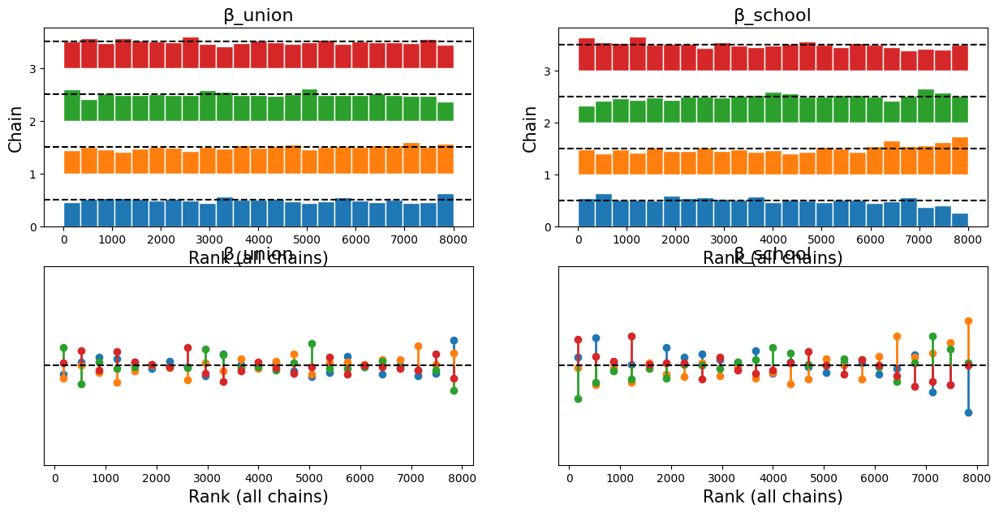

In [150]:
fig, (ax1,ax2) = plt.subplots(2,2, figsize=(15,7))
az.plot_rank(trace_hierarchical4, kind="bars", ax=ax1,var_names=['β_union',"β_school"]);
az.plot_rank(trace_hierarchical4, kind="vlines", ax=ax2,var_names=['β_union',"β_school"]);

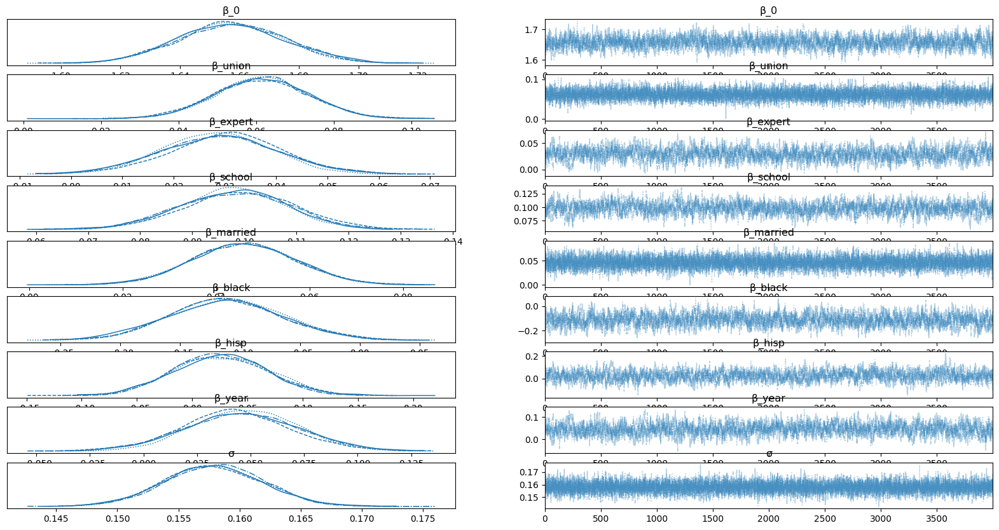

In [68]:
axes = az.plot_trace(trace_hierarchical4,var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","β_hisp","β_year","σ"], figsize=(20, 10))


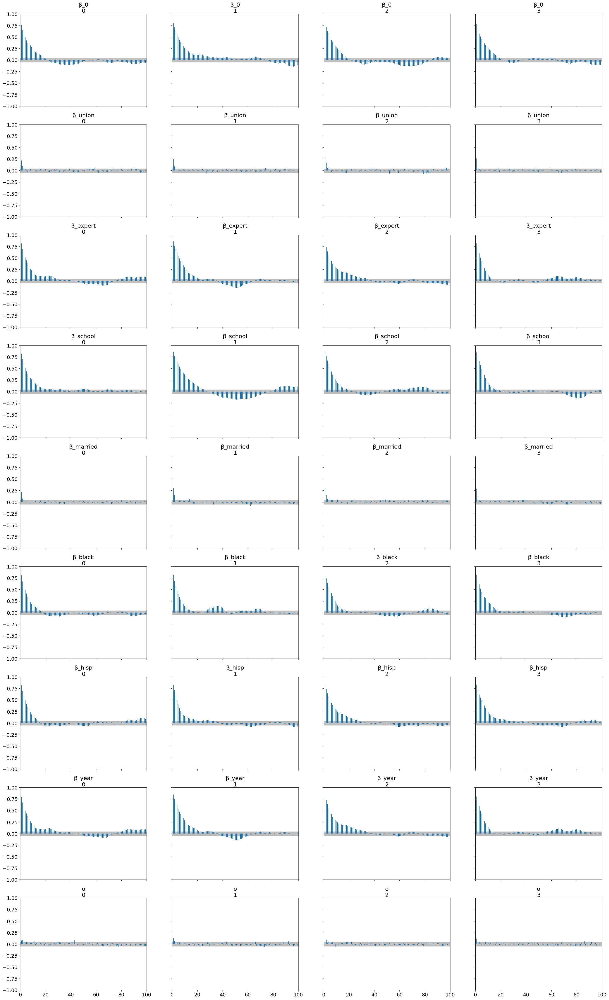

In [149]:
az.plot_autocorr(trace_hierarchical4, var_names=["β_0","β_union", "β_expert","β_school","β_married","β_black","β_hisp","β_year","σ"])
plt.show()

''

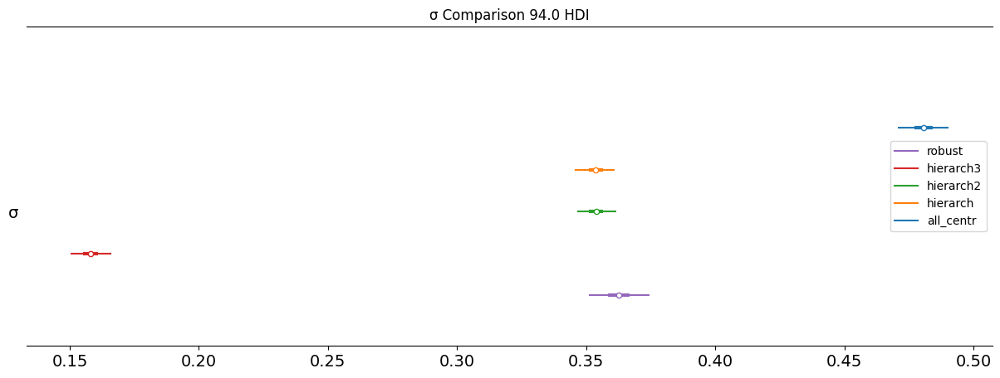

In [56]:
axes = az.plot_forest(
    [trace_centr,trace_hierarchical,trace_hierarchical2,trace_hierarchical4,trace_rob],
    model_names=["all_centr",'hierarch','hierarch2','hierarch4','robust'],
    var_names=["σ"], combined=True, figsize=(15, 5))
axes[0].set_title("σ Comparison 94.0 HDI");

In [59]:
traces =[trace_centr,trace_hierarchical,trace_hierarchical2,trace_hierarchical4,trace_rob]
model_dict = dict(zip(['all_cent','hierarch','hierarch2','hierarch4','robust'], traces))
comp = az.compare(model_dict)
comp

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
hierarch4,0,-794.583908,668.721628,0.000000,8.932428e-01,78.116654,0.000000,True,log
hierarch,1,-1911.240199,463.457820,1116.656291,1.053948e-01,143.137396,111.346182,True,log
hierarch2,2,-1911.610470,463.513866,1117.026562,8.778152e-12,142.470100,110.613089,True,log
robust,3,-2696.283406,10.233010,1901.699498,1.362343e-03,63.069018,59.582845,False,log
all_cent,4,-2998.922046,12.378547,2204.338138,1.004069e-10,100.995865,85.851970,False,log


''

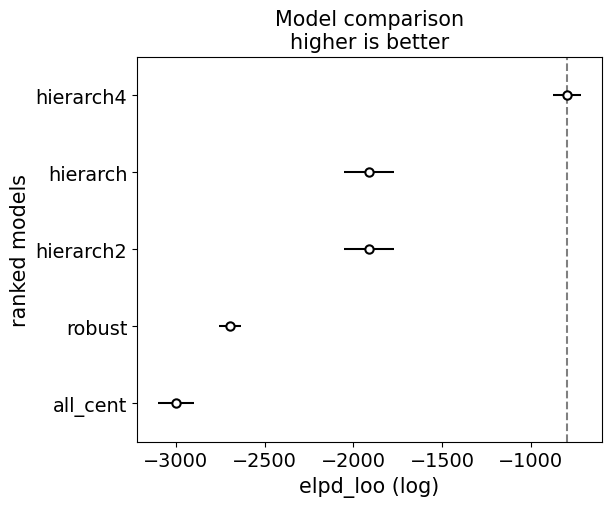

In [61]:
az.plot_compare(comp)
plt.savefig('wage.png', format='png', dpi=300)
;

## Эконометрика

In [68]:
import statsmodels.formula.api as smf
from linearmodels.panel import PanelOLS
from linearmodels.panel import RandomEffects
import statsmodels.api as sm

In [139]:
model = smf.ols('Wage ~ Union', data=data).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   Wage   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     93.04
Date:                Mon, 04 Nov 2024   Prob (F-statistic):           8.44e-22
Time:                        16:40:42   Log-Likelihood:                -3393.4
No. Observations:                4360   AIC:                             6791.
Df Residuals:                    4358   BIC:                             6803.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.6054      0.009    174.866      0.0

In [143]:
model = smf.ols('Wage ~ Union+Expert', data=data).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   Wage   R-squared:                       0.053
Model:                            OLS   Adj. R-squared:                  0.052
Method:                 Least Squares   F-statistic:                     120.7
Date:                Mon, 04 Nov 2024   Prob (F-statistic):           9.40e-52
Time:                        17:21:03   Log-Likelihood:                -3321.8
No. Observations:                4360   AIC:                             6650.
Df Residuals:                    4357   BIC:                             6669.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.3877      0.020     68.733      0.0

In [69]:
model = smf.ols('Wage ~ Union+Expert+School', data=data).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   Wage   R-squared:                       0.163
Model:                            OLS   Adj. R-squared:                  0.163
Method:                 Least Squares   F-statistic:                     283.7
Date:                Mon, 04 Nov 2024   Prob (F-statistic):          3.36e-168
Time:                        11:13:25   Log-Likelihood:                -3050.4
No. Observations:                4360   AIC:                             6109.
Df Residuals:                    4356   BIC:                             6134.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0308      0.062     -0.497      0.6

In [70]:
model = smf.ols('Wage ~ Union+Expert+School+Married', data=data).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   Wage   R-squared:                       0.176
Model:                            OLS   Adj. R-squared:                  0.175
Method:                 Least Squares   F-statistic:                     232.9
Date:                Mon, 04 Nov 2024   Prob (F-statistic):          1.93e-181
Time:                        11:13:40   Log-Likelihood:                -3016.9
No. Observations:                4360   AIC:                             6044.
Df Residuals:                    4355   BIC:                             6076.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0190      0.062      0.307      0.7

In [71]:
model = smf.ols('Wage ~ Union+Expert+School+Married+Black', data=data).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   Wage   R-squared:                       0.183
Model:                            OLS   Adj. R-squared:                  0.183
Method:                 Least Squares   F-statistic:                     195.7
Date:                Mon, 04 Nov 2024   Prob (F-statistic):          1.34e-188
Time:                        11:13:49   Log-Likelihood:                -2997.5
No. Observations:                4360   AIC:                             6007.
Df Residuals:                    4354   BIC:                             6045.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0309      0.062      0.502      0.6

In [72]:
model = smf.ols('Wage ~ Union+Expert+School+Married+Black+Hisp', data=data).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   Wage   R-squared:                       0.184
Model:                            OLS   Adj. R-squared:                  0.182
Method:                 Least Squares   F-statistic:                     163.1
Date:                Mon, 04 Nov 2024   Prob (F-statistic):          1.63e-187
Time:                        11:13:57   Log-Likelihood:                -2997.3
No. Observations:                4360   AIC:                             6009.
Df Residuals:                    4353   BIC:                             6053.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0225      0.063      0.357      0.7

In [81]:
model = smf.ols('Wage ~ Union+Expert+School+Married+Black+Hisp+Years', data=data).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   Wage   R-squared:                       0.187
Model:                            OLS   Adj. R-squared:                  0.186
Method:                 Least Squares   F-statistic:                     143.0
Date:                Mon, 04 Nov 2024   Prob (F-statistic):          2.63e-190
Time:                        11:42:08   Log-Likelihood:                -2988.2
No. Observations:                4360   AIC:                             5992.
Df Residuals:                    4352   BIC:                             6044.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -52.8571     12.404     -4.261      0.0

In [79]:
model = smf.ols('Wage ~ Union+Expert+School+Married+Black+Years', data=data).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   Wage   R-squared:                       0.187
Model:                            OLS   Adj. R-squared:                  0.186
Method:                 Least Squares   F-statistic:                     166.7
Date:                Mon, 04 Nov 2024   Prob (F-statistic):          2.42e-191
Time:                        11:41:01   Log-Likelihood:                -2988.5
No. Observations:                4360   AIC:                             5991.
Df Residuals:                    4353   BIC:                             6036.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -52.7624     12.402     -4.254      0.0

In [101]:
data2 = data.set_index(['id', 'Years'])

In [102]:
fe_model = PanelOLS.from_formula('Wage ~ Union + School + Expert + Married + Black  + EntityEffects', data=data2,drop_absorbed=True).fit()
print(fe_model.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:                   Wage   R-squared:                        0.1672
Estimator:                   PanelOLS   R-squared (Between):              0.4316
No. Observations:                4360   R-squared (Within):               0.1672
Date:                Mon, Nov 04 2024   R-squared (Overall):              0.4200
Time:                        12:26:59   Log-likelihood                   -1360.3
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      255.03
Entities:                         545   P-value                           0.0000
Avg Obs:                       8.0000   Distribution:                  F(3,3812)
Min Obs:                       8.0000                                           
Max Obs:                       8.0000   F-statistic (robust):             255.03
                            

In [96]:
fe_time = PanelOLS.from_formula(
    'Wage ~ Union + School + Expert + Married + Black  + TimeEffects',
    data=data2
).fit()

print(fe_time.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:                   Wage   R-squared:                        0.1215
Estimator:                   PanelOLS   R-squared (Between):              0.9295
No. Observations:                4360   R-squared (Within):               0.1306
Date:                Mon, Nov 04 2024   R-squared (Overall):              0.8946
Time:                        12:23:54   Log-likelihood                   -2986.5
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      120.28
Entities:                         545   P-value                           0.0000
Avg Obs:                       8.0000   Distribution:                  F(5,4347)
Min Obs:                       8.0000                                           
Max Obs:                       8.0000   F-statistic (robust):             120.28
                            

In [94]:
n = fe_model.nobs
k_fe = len(fe_model.params)
k_time = len(fe_time.params)

aic_fe = 2 * k_fe - 2 * fe_model.loglik
bic_fe = np.log(n) * k_fe - 2 * fe_model.loglik

aic_time = 2 * k_time - 2 * fe_time.loglik
bic_time = np.log(n) * k_time - 2 * fe_time.loglik

print("AIC FE:", aic_fe)
print("BIC FE:", bic_fe)
print("AIC Time:", aic_time)
print("BIC Time:", bic_time)

AIC FE: 2726.529520768298
BIC FE: 2745.670202777327
AIC Time: 5984.6434467689905
BIC Time: 6022.924810787049


In [104]:
fe_all = PanelOLS.from_formula(
    'Wage ~ Union + School + Expert + Married + Black  + EntityEffects + TimeEffects',
    data=data2,drop_absorbed=True
).fit()

print(fe_all.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:                   Wage   R-squared:                        0.0076
Estimator:                   PanelOLS   R-squared (Between):              0.0543
No. Observations:                4360   R-squared (Within):               0.0230
Date:                Mon, Nov 04 2024   R-squared (Overall):              0.0530
Time:                        12:27:30   Log-likelihood                   -1355.7
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      14.640
Entities:                         545   P-value                           0.0000
Avg Obs:                       8.0000   Distribution:                  F(2,3806)
Min Obs:                       8.0000                                           
Max Obs:                       8.0000   F-statistic (robust):             14.640
                            

In [105]:
n = fe_model.nobs
k_fe = len(fe_model.params)
k_time = len(fe_all.params)

aic_fe = 2 * k_fe - 2 * fe_model.loglik
bic_fe = np.log(n) * k_fe - 2 * fe_model.loglik

aic_time = 2 * k_time - 2 * fe_all.loglik
bic_time = np.log(n) * k_time - 2 * fe_all.loglik

print("AIC FE:", aic_fe)
print("BIC FE:", bic_fe)
print("AIC Time:", aic_time)
print("BIC Time:", bic_time)

AIC FE: 2726.529520768298
BIC FE: 2745.670202777327
AIC Time: 2715.3382231231617
BIC Time: 2728.098677795848


In [112]:
re_model = RandomEffects.from_formula('Wage ~ Union + School + Expert + Married + Black', data=data2).fit()
print(re_model.summary)

                        RandomEffects Estimation Summary                        
Dep. Variable:                   Wage   R-squared:                        0.7500
Estimator:              RandomEffects   R-squared (Between):              0.9569
No. Observations:                4360   R-squared (Within):               0.1665
Date:                Mon, Nov 04 2024   R-squared (Overall):              0.9224
Time:                        12:33:47   Log-likelihood                   -1658.7
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      2613.3
Entities:                         545   P-value                           0.0000
Avg Obs:                       8.0000   Distribution:                  F(5,4355)
Min Obs:                       8.0000                                           
Max Obs:                       8.0000   F-statistic (robust):             2613.3
                            

In [115]:
n = re_model.nobs
k_fe = len(fe_model.params)
k_time = len(re_model.params)

aic_fe = 2 * k_fe - 2 * fe_model.loglik
bic_fe = np.log(n) * k_fe - 2 * fe_model.loglik

aic_re = 2 * k_time - 2 * re_model.loglik
bic_re = np.log(n) * k_time - 2 * re_model.loglik

print("AIC FE:", aic_fe)
print("BIC FE:", bic_fe)
print("AIC RE:", aic_re)
print("BIC RE:", bic_re)

AIC FE: 2726.529520768298
BIC FE: 2745.670202777327
AIC RE: 3327.4395745709426
BIC RE: 3359.340711252658


In [118]:
from statsmodels.stats.diagnostic import het_breuschpagan
from scipy import stats
residuals = re_model.resids.values

exog = sm.add_constant(range(len(residuals)))
bp_test = het_breuschpagan(residuals, exog)
bp_test_result = dict(zip(['LM stat', 'LM p-value', 'F stat', 'F p-value'], bp_test))
print("Breusch-Pagan test:\n", bp_test_result)


shapiro_test = stats.shapiro(residuals)
print("\nРезультаты теста Шапиро-Уилка:")
print(f"Статистика: {shapiro_test.statistic}, p-значение: {shapiro_test.pvalue}")


Breusch-Pagan test:
 {'LM stat': 0.6402736062413039, 'LM p-value': 0.42361173775822236, 'F stat': 0.6400738987210012, 'F p-value': 0.4237276460302055}

Результаты теста Шапиро-Уилка:
Статистика: 0.8585813393649301, p-значение: 1.272983536159433e-52


In [121]:
fe_params = fe_model.params
re_params = re_model.params

common_params = list(set(fe_params.index).intersection(re_params.index))
fe_params = fe_params[common_params]
re_params = re_params[common_params]

fe_cov = fe_model.cov.loc[common_params, common_params]
re_cov = re_model.cov.loc[common_params, common_params]

coef_diff = fe_params - re_params

stat = np.dot(np.dot(coef_diff.T, np.linalg.inv(fe_cov - re_cov)), coef_diff)
p_value = 1 - stats.chi2.cdf(stat, len(coef_diff))

print(f"Hausman test statistic: {stat}")
print(f"p-value: {p_value}")

Hausman test statistic: 19.593919326011477
p-value: 0.00020601973762901515
